In [ ]:
!pip install git+https://github.com/pulse2percept/pulse2percept

  Cloning https://github.com/pulse2percept/pulse2percept to /tmp/pip-req-build-9ogb_fnf
  Running command git clone -q https://github.com/pulse2percept/pulse2percept /tmp/pip-req-build-9ogb_fnf
ERROR: Operation cancelled by user


In [ ]:
import pulse2percept as p2p
from pulse2percept.models import ScoreboardModel

In [ ]:
p2p.__version__

'0.8.0.dev0'

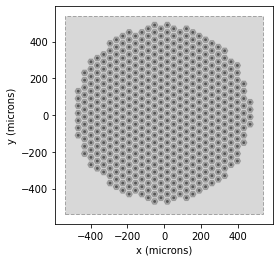

In [ ]:
model = ScoreboardModel(xrange=(-2, 2), yrange=(-2, 2), xystep=0.02, rho=20)
model.build()
implant = p2p.implants.PRIMA40()
implant.plot()
model.plot()

In [ ]:
import numpy as np
implant.stim = 10 * np.ones(532)

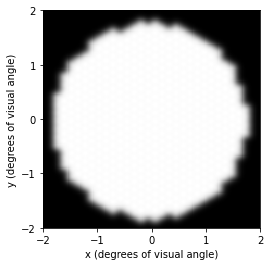

In [ ]:
percept = model.predict_percept(implant)
percept.plot()

In [ ]:
implant.n_electrodes

532

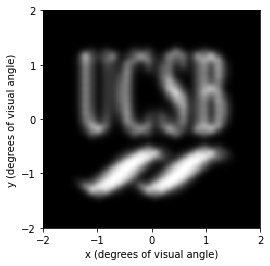

In [ ]:
implant.stim=p2p.stimuli.LogoUCSB().scale(0.8)
percept = model.predict_percept(implant)
percept.plot()

(750000, 1)

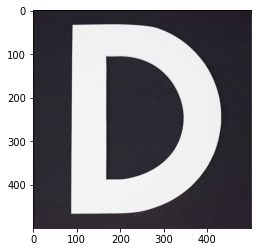

In [ ]:
stim = p2p.stimuli.ImageStimulus('8inchD.jpg')
stim.plot()
stim.shape

In [ ]:
implant.stim=stim
implant.stim.shape

(532, 1)

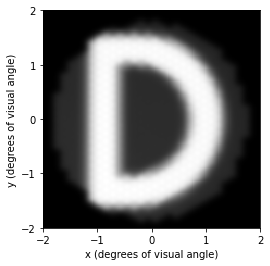

In [ ]:
percept = model.predict_percept(implant)
percept.plot()

In [ ]:
def generateVerticalGrating(height, width):
    line_width = math.floor(width / 8)
    image = np.zeros((height, width))
    
    solid = True
    count = 0
    for i in range(0,width,1): 
        count += 1
        if(solid): 
            image[:, i] = 1
        if(count == line_width): 
            count = 0 
            solid = not solid
    return image

In [ ]:
import math
img = generateVerticalGrating(25,28)

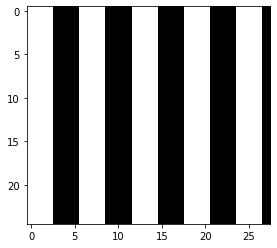

In [ ]:
plt.imshow(img,cmap='gray')

In [ ]:
implant.stim = p2p.stimuli.ImageStimulus(img)
percept = model.predict_percept(implant)

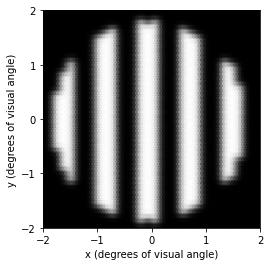

In [ ]:
percept.plot(kind='hex')

In [ ]:
video = p2p.stimuli.BostonTrain(as_gray=True)
video.play()

In [ ]:
implant.stim = video.resize(implant.shape)
percept = model.predict_percept(implant)

In [ ]:
percept.play()

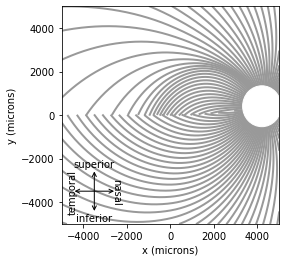

In [ ]:
p2p.models.AxonMapModel().plot()